In [1]:
# Importing necessary libraries and modules for the image classification task
import os                     # Operating system interactions
import cv2                    # OpenCV library for image processing
import matplotlib.pyplot as plt  # Visualization of images and data
import numpy as np            # Numerical computation and array handling
import seaborn as sns         # Enhanced data visualization
from sklearn.metrics import classification_report  # Evaluation report for classification
from sklearn.metrics import accuracy_score         # Accuracy metric for evaluation
from sklearn.metrics import confusion_matrix       # Confusion matrix for evaluation
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # Image data augmentation
from tensorflow.keras.applications import ResNet50    # Pre-trained ResNet50 model
from tensorflow.keras.models import Sequential       # Sequential model for stacking layers
from tensorflow.keras.layers import Dense, Flatten   # Layers for neural network architecture
from tensorflow.keras.optimizers import Adam         # Adam optimizer for training


In [2]:
# Define the class names
class_names = ['a', 'b', 'c', 'd']

In [1]:
#Description of class names


#Class a: banana fields
#Class b: grape fields
#Class c: sugarcane fields
#Class d: pathways through farm fields

SyntaxError: invalid syntax (449052166.py, line 1)

In [3]:
# Define the paths to your training, validation, and test directories
train_data_dir = 'F://experiments of 24 may//dataset june//train'
test_data_dir = 'F://experiments of 24 may//dataset june//test'

In [4]:
# Define the image dimensions
img_width, img_height = 224, 224

In [5]:
# Define the batch size and number of epochs
batch_size = 16
epochs = 30

In [6]:
# Initialize the lists for storing test labels and predicted labels
test_labels = []
predicted_labels = []

In [8]:
# Define the data generator for training and validation data
data_generator = ImageDataGenerator(rescale=1./255, validation_split=0.2)



In [9]:
# Load the training data using the data generator
train_generator = data_generator.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    subset='training',
    classes=class_names)

Found 573 images belonging to 4 classes.


In [10]:
# Load the validation data
validation_generator = data_generator.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    subset='validation',
    classes=class_names)

Found 140 images belonging to 4 classes.


In [11]:
# Initialize the ResNet-18 model
model = Sequential()
model.add(ResNet50(include_top=False, pooling='avg', weights=None))
model.add(Dense(len(class_names), activation='softmax'))

In [12]:
# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])



In [13]:

# Train the model
history= model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // batch_size,
    epochs=epochs)


Epoch 1/30
35/35 [==============================] - 119s 2s/step - loss: 2.0877 - accuracy: 0.5853 - val_loss: 7.6992 - val_accuracy: 0.2422
Epoch 2/30
35/35 [==============================] - 37s 1s/step - loss: 0.9134 - accuracy: 0.7415 - val_loss: 2.9873 - val_accuracy: 0.2344
Epoch 3/30
35/35 [==============================] - 20s 568ms/step - loss: 0.6545 - accuracy: 0.7989 - val_loss: 1.9592 - val_accuracy: 0.2422
Epoch 4/30
35/35 [==============================] - 19s 546ms/step - loss: 0.4853 - accuracy: 0.8043 - val_loss: 3.1110 - val_accuracy: 0.2422
Epoch 5/30
35/35 [==============================] - 27s 765ms/step - loss: 0.3245 - accuracy: 0.9102 - val_loss: 4.6708 - val_accuracy: 0.2422
Epoch 6/30
35/35 [==============================] - 19s 551ms/step - loss: 0.3327 - accuracy: 0.8725 - val_loss: 2.8103 - val_accuracy: 0.2266
Epoch 7/30
35/35 [==============================] - 20s 555ms/step - loss: 0.4051 - accuracy: 0.8923 - val_loss: 2.5208 - val_accuracy: 0.1484
Epoc

In [14]:
# Load the test data using the data generator
test_generator = data_generator.flow_from_directory(
    test_data_dir,
    target_size=(img_width, img_height),
    batch_size=1,
    class_mode=None,
    shuffle=False,
    classes=class_names)

Found 38 images belonging to 4 classes.


In [15]:
# Get the true labels for the test data
test_labels = test_generator.classes

In [18]:
# Generate predictions for the test data
predictions = model.predict(test_generator)

In [19]:
# Get the predicted labels by mapping the predicted class indices to class names
predicted_labels = [class_names[np.argmax(pred)] for pred in predictions]


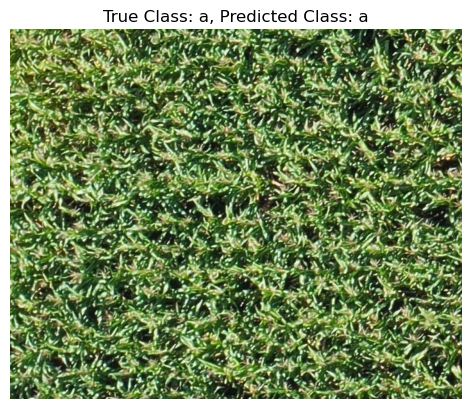

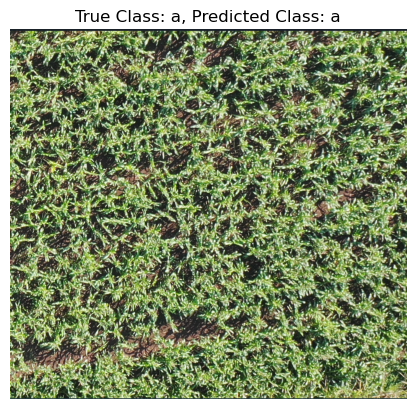

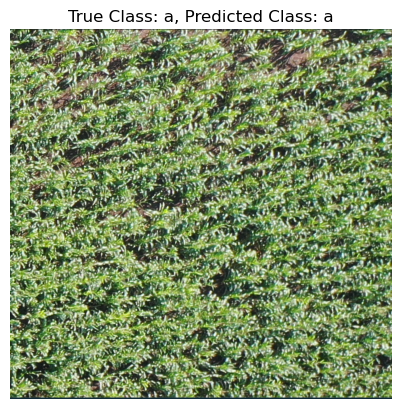

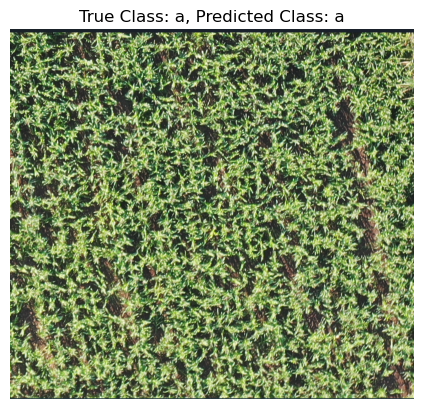

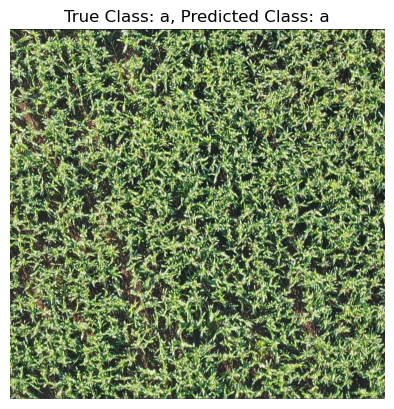

...

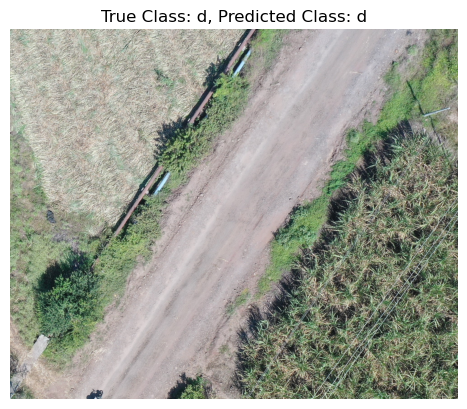

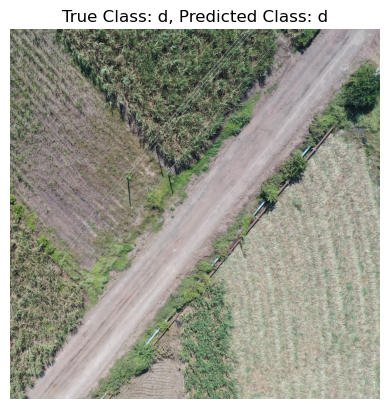

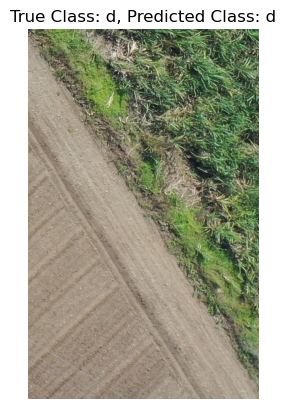

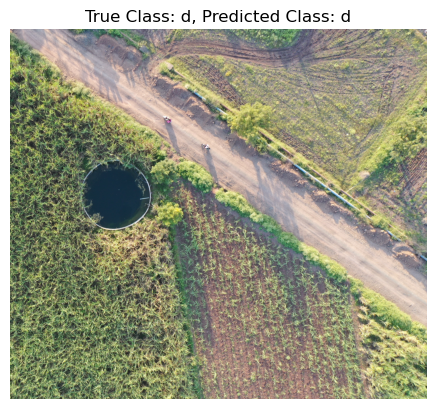

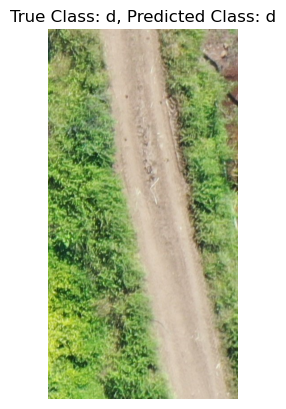

In [20]:
# Display the true class and predicted class for each test image
for i in range(len(predicted_labels)):
    image_path = test_generator.filepaths[i]
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    true_class = class_names[test_labels[i]]
    predicted_class = predicted_labels[i]
    plt.imshow(image)
    plt.title(f"True Class: {true_class}, Predicted Class: {predicted_class}")
    plt.axis('off')
    plt.show()


In [22]:
# Calculate test accuracy
test_accuracy = accuracy_score(test_labels, [class_names.index(label) for label in predicted_labels])
print(f"Test Accuracy: {test_accuracy}")

Test Accuracy: 0.868421052631579


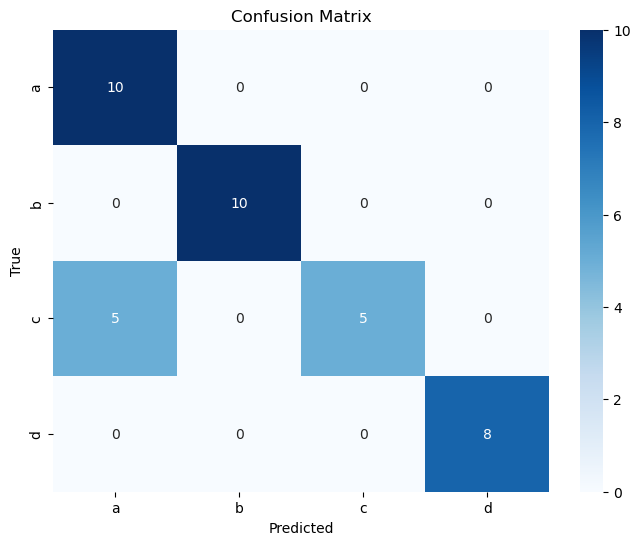

In [25]:
# Plot confusion matrix
cm = confusion_matrix(test_labels, [class_names.index(label) for label in predicted_labels])
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

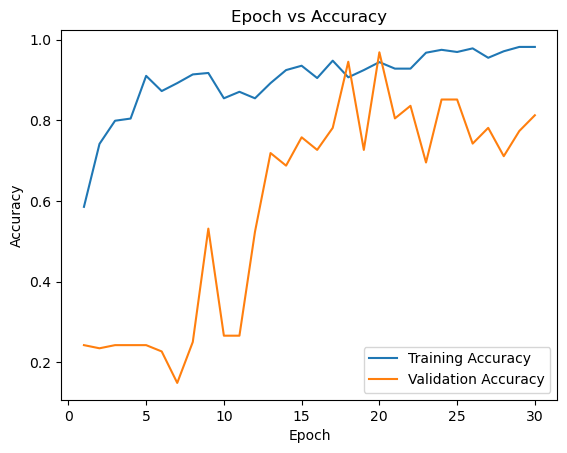

In [26]:
# Store the training accuracy and validation accuracy for each epoch
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Generate the epoch numbers
epochs_range = range(1, epochs + 1)

# Plot the epoch vs accuracy graph
plt.plot(epochs_range, train_accuracy, label='Training Accuracy')
plt.plot(epochs_range, val_accuracy, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Epoch vs Accuracy')
plt.legend()
plt.show()
